<a href="https://colab.research.google.com/github/Prity-ai/websitechanges/blob/master/Wheat_all_isro_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.9 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.model_selection import KFold, train_test_split, GridSearchCV
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.cross_decomposition import PLSRegression
from itertools import product
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.experimental import enable_hist_gradient_boosting  # Enable HistGradientBoosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.model_selection import cross_val_predict, RepeatedKFold



In [ ]:
# Load the data
from google.colab import drive
drive.mount('/content/drive')

file_path ="/content/drive/MyDrive/modeldata.xlsx"
sheet_name = 'wheat'
df = pd.read_excel(file_path, sheet_name=sheet_name)

Mounted at /content/drive


In [ ]:
df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)
x = df.drop(['Wheat_price', 'Date','Wheat_CoC'], axis=1)
y = df['Wheat_price']

# Feature scaling
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
#################################################### new add ###################################################

# Lists to store feature importances for different models
feature_importances = {
    'Random Forest': [],
    'GBRT': [],
    'LightGBM': [],
    'CatBoost': [],
    'XGBoost': [],
    'Adaboost': [],
    'Extra Trees': []
}

# Lists to store NRMSE scores for different models
nrmse_scores = {
    'Linear Regression': [],
    'PLSR': [],
    'Random Forest': [],
    'GBRT': [],
    'SVM': [],
    'LightGBM': [],
    'CatBoost': [],
    'Lasso': [],
    'Ridge': [],
    'ElasticNet': [],
    'XGBoost': [],
    'Adaboost': [],
    'Extra Trees': []
}

# Store model parameters for different models
model_parameters = {
    'Linear Regression': {},
    'PLSR': {},
    'Random Forest': {},
    'GBRT': {},
    'SVM': {},
    'LightGBM': {},
    'CatBoost': {},
    'Lasso': {},
    'Ridge': {},
    'ElasticNet': {},
    'XGBoost': {},
    'Adaboost': {},
    'Extra Trees': {}
}

In [ ]:
######################### new
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import numpy as np

# Create a dictionary to store hyperparameter grids for all models
hyperparameter_grids = {
    'Linear Regression': {
        'fit_intercept': [True, False]
    },
    'PLSR': {
        'n_components': [2, 3, 5]
    },
    'Random Forest': {
        'n_estimators': [50, 100, 150],
        'max_depth': [5, 10]
    },
    'GBRT': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.001, 0.01, 0.1],
        'max_depth': [3, 5, 7]
    },
    'SVM': {
        'C': [0.1, 1.0, 10.0],
        'kernel': ['linear', 'rbf']
    },
    'LightGBM': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.001, 0.01, 0.1, 0.2],
        'max_depth': [5, 10]
    },
    'CatBoost': {
        'iterations': [50, 100, 150],
        'learning_rate': [0.001, 0.01, 0.1],
        'depth': [4, 6, 8]
    },
    'Lasso': {
        'alpha': [0.01, 0.1, 1.0, 10.0]
    },
    'Ridge': {
        'alpha': [0.01, 0.1, 1.0, 10.0]
    },
    'ElasticNet': {
        'alpha': [0.01, 0.1, 1.0, 10.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.001, 0.01, 0.1],
        'max_depth': [3, 5, 7]
    },
    'Adaboost': {
        'n_estimators': [25, 50, 100, 150],
        'learning_rate': [0.001, 0.01, 0.1]
    },
    'Extra Trees': {
        'n_estimators': [50, 75, 100],
        'max_depth': [5, 10]
    }
}


In [ ]:
from sklearn.model_selection import cross_val_score, RepeatedKFold
cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=42)

# DataFrames for storing predictions and NRMSE values
predictions_df = pd.DataFrame()
nrmse_df = pd.DataFrame()

# For storing best hyperparameters and model performance
best_hyperparameters = {}
best_nrmse_scores = {}


for model_name, param_grid in hyperparameter_grids.items():
    print(f'Tuning hyperparameters for {model_name}')

    # Initialize the model
    model = None
    if model_name == 'Linear Regression':
        model = LinearRegression()
    elif model_name == 'PLSR':
        model = PLSRegression()
    elif model_name == 'Random Forest':
        model = RandomForestRegressor()
    elif model_name == 'GBRT':
        model = GradientBoostingRegressor()
    elif model_name == 'SVM':
        model = SVR()
    elif model_name == 'LightGBM':
        model = LGBMRegressor()
    elif model_name == 'CatBoost':
        model = CatBoostRegressor()
    elif model_name == 'Lasso':
        model = Lasso()
    elif model_name == 'Ridge':
        model = Ridge()
    elif model_name == 'ElasticNet':
        model = ElasticNet()
    elif model_name == 'XGBoost':
        model = XGBRegressor()
    elif model_name == 'Adaboost':
        model = AdaBoostRegressor()
    elif model_name == 'Extra Trees':
        model = ExtraTreesRegressor()

    # Perform grid search with cross-validation using cross_val_score
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=cv)
    grid_search.fit(X_train, y_train)

    # Get the best hyperparameters
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    # Store predictions for this model in a list first (for efficiency)
    predictions = []
    nrmse_scores = []


    # Store best hyperparameters
    best_hyperparameters[model_name] = best_params

    for train_idx, val_idx in cv.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

        best_model.fit(X_train_fold, y_train_fold)
        preds = best_model.predict(X_val_fold)

        predictions.extend(preds)

        mse = mean_squared_error(y_val_fold, preds)
        nrmse = (np.sqrt(mse) / y_val_fold.mean()) * 100
        nrmse_scores.append(nrmse)

    predictions_df[model_name] = predictions
    nrmse_df[model_name] = nrmse_scores
    # Calculate the mean NRMSE for the current model
    mean_nrmse = np.mean(nrmse_scores)

    # Check if we have the best NRMSE for this model so far
    if model_name not in best_nrmse_scores or mean_nrmse < best_nrmse_scores[model_name]:
        best_hyperparameters[model_name] = best_params
        best_nrmse_scores[model_name] = nrmse

Streaming output truncated to the last 5000 lines.
101:	learn: 23.5766030	total: 954ms	remaining: 449ms
102:	learn: 23.0349868	total: 960ms	remaining: 438ms
103:	learn: 22.5163745	total: 965ms	remaining: 427ms
104:	learn: 22.0289268	total: 971ms	remaining: 416ms
105:	learn: 21.7091292	total: 976ms	remaining: 405ms
106:	learn: 21.3382660	total: 982ms	remaining: 395ms
107:	learn: 20.8320548	total: 987ms	remaining: 384ms
108:	learn: 20.6989998	total: 993ms	remaining: 373ms
109:	learn: 20.1916510	total: 999ms	remaining: 363ms
110:	learn: 19.9757679	total: 1s	remaining: 353ms
111:	learn: 19.7409299	total: 1.01s	remaining: 342ms
112:	learn: 19.2443819	total: 1.01s	remaining: 332ms
113:	learn: 18.7266334	total: 1.02s	remaining: 322ms
114:	learn: 18.2983864	total: 1.03s	remaining: 314ms
115:	learn: 18.1849165	total: 1.04s	remaining: 304ms
116:	learn: 17.8258612	total: 1.04s	remaining: 295ms
117:	learn: 17.4983280	total: 1.06s	remaining: 287ms
118:	learn: 17.1055722	total: 1.06s	remaining: 277m

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.230e+04, tolerance: 1.753e+03
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.018e+03, tolerance: 1.972e+03
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.888e+03, tolerance: 1.822e

Tuning hyperparameters for Ridge
Tuning hyperparameters for ElasticNet


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.144e+03, tolerance: 1.882e+03
  model = cd_fast.enet_coordinate_descent(


Tuning hyperparameters for XGBoost
Tuning hyperparameters for Adaboost
Tuning hyperparameters for Extra Trees


In [ ]:
# Print the best hyperparameters and NRMSE for each model
for model_name, best_params in best_hyperparameters.items():
    print(f'Best hyperparameters for {model_name}: {best_params}')
    #print(f'Best NRMSE for {model_name}: {best_nrmse_scores[model_name].mean()}')

Best hyperparameters for Linear Regression: {'fit_intercept': True}
Best hyperparameters for PLSR: {'n_components': 3}
Best hyperparameters for Random Forest: {'max_depth': 10, 'n_estimators': 150}
Best hyperparameters for GBRT: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
Best hyperparameters for SVM: {'C': 10.0, 'kernel': 'linear'}
Best hyperparameters for LightGBM: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
Best hyperparameters for CatBoost: {'depth': 6, 'iterations': 150, 'learning_rate': 0.1}
Best hyperparameters for Lasso: {'alpha': 10.0}
Best hyperparameters for Ridge: {'alpha': 10.0}
Best hyperparameters for ElasticNet: {'alpha': 0.1, 'l1_ratio': 0.5}
Best hyperparameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
Best hyperparameters for Adaboost: {'learning_rate': 0.1, 'n_estimators': 100}
Best hyperparameters for Extra Trees: {'max_depth': 10, 'n_estimators': 50}


In [ ]:
# Save nrmse to excel of Google Drive
file_path = "/content/drive/MyDrive/nrmse_values_allcrop.xlsx"
with pd.ExcelWriter(file_path) as writer:
    nrmse_df.to_excel(writer, sheet_name='Wheat_all', index=False)

# Save predictions to excel of Google Drive
file_path = "/content/drive/MyDrive/cvprediction_values_allcrop.xlsx"
with pd.ExcelWriter(file_path) as writer:
    predictions_df.to_excel(writer, sheet_name='Wheat_all', index=False)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 739
[LightGBM] [Info] Number of data points in the train set: 163, number of used features: 16
[LightGBM] [Info] Start training from score 1471.957358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

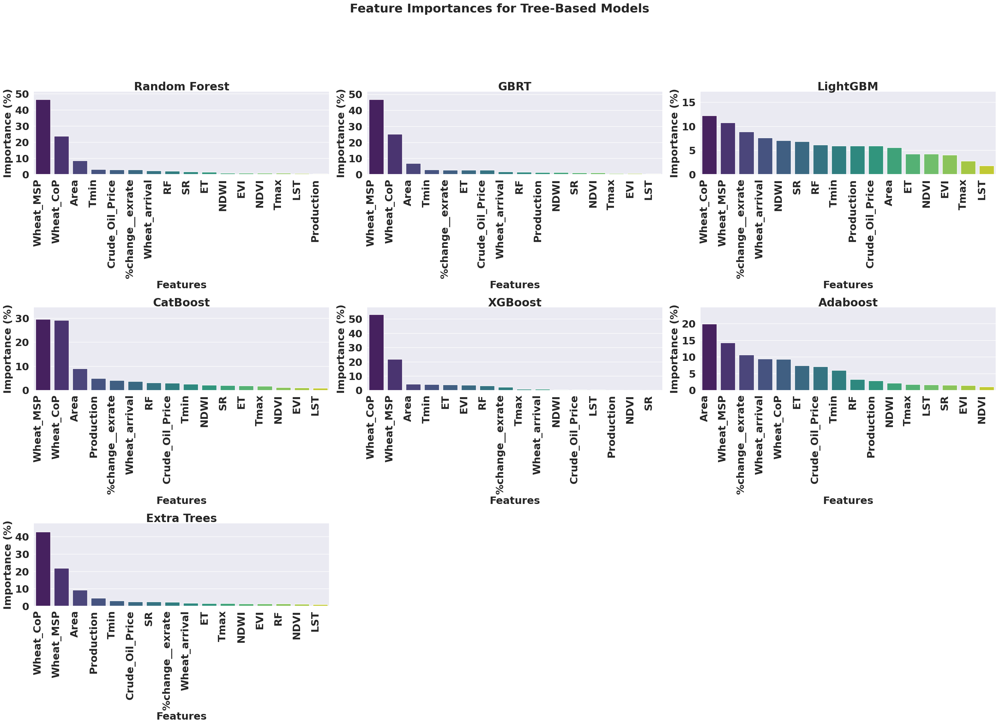

In [87]:
############### better varuable importance @@@@@@@@@@@@@@@@@@@@@@@@@@

import matplotlib.pyplot as plt
import seaborn as sns

# Initialize models for tree-based algorithms
tree_based_models = {
    'Random Forest': RandomForestRegressor(),
    'GBRT': GradientBoostingRegressor(),
    'LightGBM': LGBMRegressor(),
    'CatBoost': CatBoostRegressor(silent=True),  # silent=True to avoid iteration-wise output
    'XGBoost': XGBRegressor(),
    'Adaboost': AdaBoostRegressor(),
    'Extra Trees': ExtraTreesRegressor()
}

import matplotlib.pyplot as plt
import seaborn as sns

# Initialize models for tree-based algorithms
tree_based_models = {
    'Random Forest': RandomForestRegressor(),
    'GBRT': GradientBoostingRegressor(),
    'LightGBM': LGBMRegressor(),
    'CatBoost': CatBoostRegressor(silent=True),  # silent=True to suppress output during training
    'XGBoost': XGBRegressor(),
    'Adaboost': AdaBoostRegressor(),
    'Extra Trees': ExtraTreesRegressor()
}

# Set a color palette for better aesthetics
colors = sns.color_palette("viridis", n_colors=X_train.shape[1])

# Create subplots for feature importances with increased width
fig, axs = plt.subplots(3, 3, figsize=(30, 20), dpi=100)
fig.suptitle('Feature Importances for Tree-Based Models', fontsize=26, y=1.08, fontweight='bold', fontfamily='DejaVu Sans')

# Flatten the 3x3 array of subplots
axs = axs.ravel()

for idx, (model_name, model) in enumerate(tree_based_models.items()):
    if idx < 7:
        model.fit(X_train, y_train)
        if hasattr(model, 'feature_importances_'):
            importances = model.feature_importances_
            importances = (importances / importances.sum()) * 100
            indices = np.argsort(importances)[::-1]
            feature_names = X_train.columns

            sns.barplot(x=feature_names[indices], y=importances[indices], ax=axs[idx], palette=colors)

            # Removing spines
            for spine in ax.spines.values():
                spine.set_visible(False)

            axs[idx].set_title(model_name, fontsize=24, fontweight='bold', fontfamily='DejaVu Sans', y=0.98)  # Adjusted y here for the title
            axs[idx].set_xticklabels(feature_names[indices], rotation=90, ha='right', fontsize=22, fontweight='bold', fontfamily='DejaVu Sans')
            axs[idx].set_xlabel('Features', fontweight='bold', fontsize=22, fontfamily='DejaVu Sans')
            axs[idx].set_ylabel('Importance (%)', fontsize=22, fontweight='bold', fontfamily='DejaVu Sans')
            axs[idx].set_ylim(0, max(importances) + 5)

            # Making y-tick labels bold
            for label in axs[idx].get_yticklabels():
                label.set_fontweight('bold')
                label.set_fontsize(22)
        else:
            axs[idx].set_title(f'{model_name} does not have feature importances.', fontsize=18, fontweight='bold', fontfamily='DejaVu Sans', y=0.98)  # Adjusted y here for the title
            axs[idx].axis('off')

# Remove the last two subplots
fig.delaxes(axs[7])
fig.delaxes(axs[8])

plt.tight_layout()
plt.subplots_adjust(hspace=1.6)  # Increase vertical space between subplots
plt.show()


############### better varuable importance @@@@@@@@@@@@@@@@@@@@@@@@@@


In [88]:
############################### more better box plot ###############

import matplotlib.pyplot as plt
import seaborn as sns

# Set up seaborn aesthetics
sns.set_style("whitegrid")

# Create a list of tree-based models
tree_based_models = ['Random Forest', 'GBRT', 'LightGBM', 'CatBoost', 'XGBoost', 'Adaboost', 'Extra Trees']

# Create a list of other models
other_models = [model for model in nrmse_df.columns if model not in tree_based_models]

# Set the color palettes
palette_tree = sns.color_palette("husl", n_colors=len(tree_based_models))
palette_other = sns.color_palette("husl", n_colors=len(other_models))

# Create subplots for box plots (1 row, 2 columns)
fig, axs = plt.subplots(1, 2, figsize=(20, 10), dpi=600)
fig.suptitle('Box Plots of NRMSE Scores for Different Models', fontsize=20, y=1.08, weight='bold')

# Box plot for tree-based models with enhanced line visibility
sns.boxplot(data=nrmse_df[tree_based_models], ax=axs[0], width=0.5, palette=palette_tree,
            boxprops=dict(edgecolor="black", linewidth=2),
            whiskerprops=dict(color="black", linewidth=2),
            capprops=dict(color="black", linewidth=2),
            medianprops=dict(color="black", linewidth=2))
axs[0].set_xticklabels(tree_based_models, rotation=45, fontsize=12, weight='bold')
axs[0].set_title('Tree-Based Models NRMSE', fontsize=16, weight='bold')
axs[0].set_ylabel('NRMSE Score', fontsize=14, weight='bold')

# Box plot for other models with enhanced line visibility
sns.boxplot(data=nrmse_df[other_models], ax=axs[1], width=0.5, palette=palette_other,
            boxprops=dict(edgecolor="black", linewidth=2),
            whiskerprops=dict(color="black", linewidth=2),
            capprops=dict(color="black", linewidth=2),
            medianprops=dict(color="black", linewidth=2))
axs[1].set_xticklabels(other_models, rotation=45, fontsize=12, weight='bold')
axs[1].set_title('Other Models NRMSE', fontsize=16, weight='bold')
axs[1].set_ylabel('NRMSE Score', fontsize=14, weight='bold')

# Show the plot
plt.tight_layout()
plt.show()

##################################################### box Plot ######################

In [ ]:
###########################################
#best vis#



import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns  # For better color palettes and themes

# Set a color palette and style for better aesthetics
custom_palette = ['#0062B4', '#daa520']  # Darker blue and red
sns.set_palette(custom_palette)

#2c7bb6
#sns.set_palette("Paired")
sns.set_style("whitegrid")

fig, axes = plt.subplots(5, 3, figsize=(18, 22), dpi=500, gridspec_kw={'hspace': 0.7, 'wspace': 0.4})
fig.suptitle('Scatter Plots of Model Fit for Train and Test Data', fontsize=20, y=1.05)

# Initialize models with their respective best hyperparameters
included_models = [
    'Linear Regression', 'PLSR', 'Random Forest', 'GBRT', 'SVM',
    'LightGBM', 'CatBoost', 'Lasso', 'Ridge', 'ElasticNet',
    'XGBoost', 'Adaboost', 'Extra Trees'
]

for i, model_name in enumerate(included_models):
    row = i // 3
    col = i % 3
    ax = axes[row, col]

    # Initialize the model with the best hyperparameters

    best_params = best_hyperparameters[model_name]
    if model_name == 'Linear Regression':
        model = LinearRegression(**best_params)
    elif model_name == 'PLSR':
        model = PLSRegression(**best_params)
    elif model_name == 'Random Forest':
        model = RandomForestRegressor(**best_params)
    elif model_name == 'GBRT':
        model = GradientBoostingRegressor(**best_params)
    elif model_name == 'SVM':
        model = SVR(**best_params)
    elif model_name == 'LightGBM':
        model = LGBMRegressor(**best_params)
    elif model_name == 'CatBoost':
        model = CatBoostRegressor(**best_params)
    elif model_name == 'Lasso':
        model = Lasso(**best_params)
    elif model_name == 'Ridge':
        model = Ridge(**best_params)
    elif model_name == 'ElasticNet':
        model = ElasticNet(**best_params)
    elif model_name == 'XGBoost':
        model = XGBRegressor(**best_params)
    elif model_name == 'Adaboost':
        model = AdaBoostRegressor(**best_params)
    elif model_name == 'Extra Trees':
        best_params1et = {
        'n_estimators': 100,
        'max_depth': 10,
        }
        model = ExtraTreesRegressor(**best_params1et)


    # Model fitting
    model.fit(X_train, y_train)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Error metrics
    nrmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred)) / np.mean(y_train)
    nrmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred)) / np.mean(y_test)

    # R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    # Adjusted R2 scores
    n = X_train.shape[0]
    p = X_train.shape[1]
    adj_r2_train = 1 - ((1 - r2_train) * (n - 1) / (n - p - 1))
    adj_r2_test = 1 - ((1 - r2_test) * (n - 1) / (n - p - 1))

    # Displaying error metrics above each subplot
    ax.set_title(f'{model_name}\nNRMSE Train={nrmse_train:.4f}, NRMSE Test={nrmse_test:.4f}\n'
                 f'Adj R-squared Train={adj_r2_train:.4f}, Adj R-squared Test={adj_r2_test:.4f}', fontsize=10, fontweight='bold')

    # Scatter plots with larger markers
    ax.scatter(y_train, y_train_pred, label='Train Data', alpha=0.7, color=custom_palette[0], s=50)
    ax.scatter(y_test, y_test_pred, label='Test Data', alpha=0.7, color=custom_palette[1], s=50)

    # 45-degree reference line
    ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='red', linewidth=1)

    # Axes labels and legend
    # Bold the axes labels and legend
    ax.set_xlabel('Actual Values', fontweight='bold')
    ax.set_ylabel('Predicted Values', fontweight='bold')
    ax.legend()

# Remove any unused subplots
for i in range(len(included_models), 15):
    row = i // 3
    col = i % 3
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()
###########################################
#best vis#



<ipython-input-86-4b837ba338e1>:99: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='red', linewidth=1)
<ipython-input-86-4b837ba338e1>:99: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='red', linewidth=1)
<ipython-input-86-4b837ba338e1>:99: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='red', linewidth=1)
<ipython-input-86-4b837ba338e1>:99: UserWarning: color is redundantly defined by the 'color' keyword argument

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000060 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 736
[LightGBM] [Info] Number of data points in the train set: 163, number of used features: 16
[LightGBM] [Info] Start training from score 1471.957358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

<ipython-input-86-4b837ba338e1>:99: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='red', linewidth=1)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.375e+06, tolerance: 2.296e+03
  model = cd_fast.enet_coordinate_descent(
<ipython-input-86-4b837ba338e1>:99: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='red', linewidth=1)
<ipython-input-86-4b837ba338e1>:99: UserWarning: color is

In [ ]:
# Set a color palette and style for better aesthetics
custom_palette = ['#0062B4', '#daa520']  # Darker blue and red
sns.set_palette(custom_palette)

#2c7bb6
#sns.set_palette("Paired")
sns.set_style("whitegrid")

In [95]:
###########################################
# enhanced vis #
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns

# Set a richer color palette and style for improved aesthetics
custom_palette = ['#556B2F', '#800000']
sns.set_palette(custom_palette)

# Adjusting Seaborn style settings
sns.set_style("whitegrid", {
    'axes.edgecolor': 'none',
    'axes.facecolor': 'none',
    'grid.linestyle': '-',
    'xtick.bottom': True,  # Change this line
    'ytick.left': False,
    'grid.color': 'gray'
})


fig, axes = plt.subplots(5, 3, figsize=(18, 22), dpi=600, gridspec_kw={'hspace': 0.7, 'wspace': 0.4})
fig.suptitle('Scatter Plots of Model Fit for Train and Test Data', fontsize=20, y=1.05)

# Initialize models with their respective best hyperparameters
included_models = [
    'Linear Regression', 'PLSR', 'Random Forest', 'GBRT', 'SVM',
    'LightGBM', 'CatBoost', 'Lasso', 'Ridge', 'ElasticNet',
    'XGBoost', 'Adaboost', 'Extra Trees'
]

for i, model_name in enumerate(included_models):
    row = i // 3
    col = i % 3
    ax = axes[row, col]

    # Initialize the model with the best hyperparameters

    best_params = best_hyperparameters[model_name]
    if model_name == 'Linear Regression':
        model = LinearRegression(**best_params)
    elif model_name == 'PLSR':
        model = PLSRegression(**best_params)
    elif model_name == 'Random Forest':
        model = RandomForestRegressor(**best_params)
    elif model_name == 'GBRT':
        model = GradientBoostingRegressor(**best_params)
    elif model_name == 'SVM':
        model = SVR(**best_params)
    elif model_name == 'LightGBM':
        model = LGBMRegressor(**best_params)
    elif model_name == 'CatBoost':
        model = CatBoostRegressor(**best_params)
    elif model_name == 'Lasso':
        model = Lasso(**best_params)
    elif model_name == 'Ridge':
        model = Ridge(**best_params)
    elif model_name == 'ElasticNet':
        model = ElasticNet(**best_params)
    elif model_name == 'XGBoost':
        model = XGBRegressor(**best_params)
    elif model_name == 'Adaboost':
        model = AdaBoostRegressor(**best_params)
    elif model_name == 'Extra Trees':
        best_params1et = {
        'n_estimators': 100,
        'max_depth': 10,
        }
        model = ExtraTreesRegressor(**best_params1et)


    # Model fitting
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Error metrics
    nrmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred)) / np.mean(y_train)
    nrmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred)) / np.mean(y_test)

    # R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    # Adjusted R2 scores
    n = X_train.shape[0]
    p = X_train.shape[1]
    adj_r2_train = 1 - ((1 - r2_train) * (n - 1) / (n - p - 1))
    adj_r2_test = 1 - ((1 - r2_test) * (n - 1) / (n - p - 1))

    # Displaying error metrics above each subplot
    ax.set_title(f'{model_name}\nNRMSE Train={nrmse_train:.4f}, NRMSE Test={nrmse_test:.4f}\n'
                 f'Adj R-squared Train={adj_r2_train:.4f}, Adj R-squared Test={adj_r2_test:.4f}', fontsize=10, fontweight='bold')

    # Scatter plots with the new color palette
    train_scatter = ax.scatter(y_train, y_train_pred, label='Train Data', color=sns.color_palette()[0], alpha=0.7, s=50)
    test_scatter = ax.scatter(y_test, y_test_pred, label='Test Data', color=sns.color_palette()[1], alpha=0.7, s=50)

    # Reference line
    ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='gray', linewidth=1.5)

    # Adjust axes labels
    ax.set_xlabel('Actual Values', fontweight='bold', fontsize=12)
    ax.set_ylabel('Predicted Values', fontweight='bold', fontsize=12)

    # Turn off vertical grid lines and enable horizontal ones
    ax.yaxis.grid(True, which='major')  # Enable horizontal grid lines
    ax.xaxis.grid(False)  # Disable vertical grid lines

    # Making all x-ticks and y-ticks bold and adjusting font size
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight('bold')
        label.set_fontsize(8)  # Set to desired font size, for example 8

    # Legend in the lower right corner without title and with bold labels
    legend = ax.legend(handles=[train_scatter, test_scatter], labels=['Train Data', 'Test Data'], loc='lower right', prop={'weight':'bold'})

    # Manually adjust font size for each text in the legend
    for text in legend.get_texts():
        text.set_fontsize(10)



# Remove any unused subplots
for i in range(len(included_models), 15):
    row = i // 3
    col = i % 3
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()
###########################################


<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='gray', linewidth=1.5)
<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='gray', linewidth=1.5)
<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='gray', linewidth=1.5)
<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' key

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 739
[LightGBM] [Info] Number of data points in the train set: 163, number of used features: 16
[LightGBM] [Info] Start training from score 1471.957358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='gray', linewidth=1.5)
<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='gray', linewidth=1.5)
<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', color='gray', linewidth=1.5)
<ipython-input-95-2cfa843f3346>:102: UserWarning: color is redundantly defined by the 'color' key

In [ ]:
import pandas as pd
from openpyxl import Workbook  # Required for saving styled DataFrames to Excel

# Create an empty DataFrame to store predictions
results_df = pd.DataFrame()

# Assuming you have 'Date' column in your original dataset. If you don't, just comment this out.
# results_df["Date"] = pd.concat([X_train["Date"], X_test["Date"]], ignore_index=True)
results_df["Actual Values"] = pd.concat([y_train, y_test], ignore_index=True)

for model_name in included_models:
    # Model initialization (the previous code you've given)
    best_params = best_hyperparameters[model_name]
    # ... [Model Initialization Code] ...
    if model_name == 'Linear Regression':
        model = LinearRegression(**best_params)
    elif model_name == 'PLSR':
        model = PLSRegression(**best_params)
    elif model_name == 'Random Forest':
        model = RandomForestRegressor(**best_params)
    elif model_name == 'GBRT':
        model = GradientBoostingRegressor(**best_params)
    elif model_name == 'SVM':
        model = SVR(**best_params)
    elif model_name == 'LightGBM':
        model = LGBMRegressor(**best_params)
    elif model_name == 'CatBoost':
        model = CatBoostRegressor(**best_params)
    elif model_name == 'Lasso':
        model = Lasso(**best_params)
    elif model_name == 'Ridge':
        model = Ridge(**best_params)
    elif model_name == 'ElasticNet':
        model = ElasticNet(**best_params)
    elif model_name == 'XGBoost':
        model = XGBRegressor(**best_params)
    elif model_name == 'Adaboost':
        model = AdaBoostRegressor(**best_params)
    elif model_name == 'Extra Trees':
        model = ExtraTreesRegressor(**best_params1et)

    # Model fitting
    model.fit(X_train, y_train)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)


    # Reshape the predictions to ensure they are 2-dimensional with one column
    y_train_pred_reshaped = y_train_pred.reshape(-1, 1)
    y_test_pred_reshaped = y_test_pred.reshape(-1, 1)

    # Stack y_train_pred and y_test_pred vertically
    all_predictions_array = np.vstack((y_train_pred_reshaped, y_test_pred_reshaped))

    # Convert the stacked array to a Pandas Series
    all_predictions = pd.Series(all_predictions_array.flatten())

    # Add these predictions to the results DataFrame
    results_df[model_name] = all_predictions.values


# Define color styles
def highlight_train(s):
    return ['background-color: yellow' if i < len(y_train) else '' for i in range(len(s))]

def highlight_test(s):
    return ['background-color: lightgreen' if i >= len(y_train) else '' for i in range(len(s))]

# Apply styles to the DataFrame
styled_results = results_df.style.apply(highlight_train).apply(highlight_test)

# Save styled DataFrame to Excel first
#with pd.ExcelWriter("predictions_styled.xlsx", engine='openpyxl') as writer:
#    styled_results.to_excel(writer, index=False)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


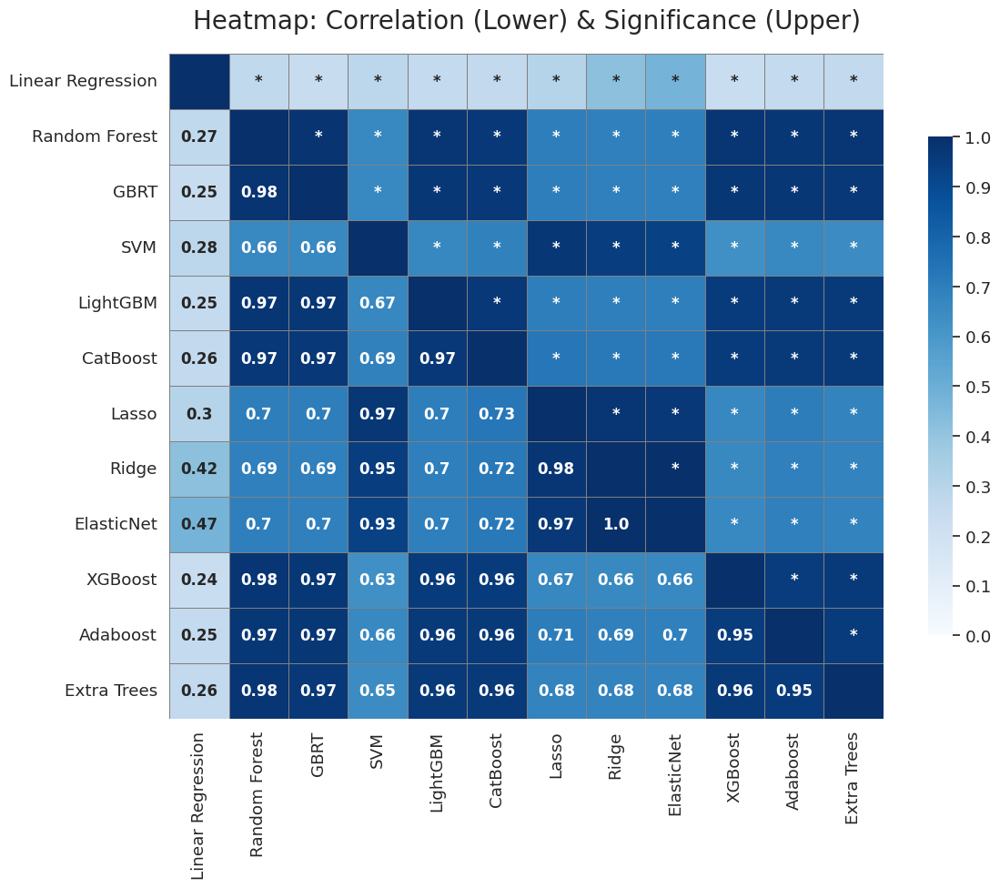

In [97]:
from google.colab import drive
drive.mount('/content/drive')
file_path = "/content/drive/MyDrive/cvprediction_values_allcrop.xlsx"
sheet_name = 'Wheat_all'

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

# Read the Excel file
dfheatmap = pd.read_excel(file_path, sheet_name=sheet_name)

# Filter only numeric columns for correlation and significance calculation
numeric_cols = dfheatmap.select_dtypes(include=[np.number]).columns
numeric_df = dfheatmap[numeric_cols]

# Calculate correlation
corr = numeric_df.corr()

# Create masks for upper and lower triangles
mask_upper = np.triu(np.ones_like(corr, dtype=bool))
mask_lower = np.tril(np.ones_like(corr, dtype=bool), -1)

# Calculate p-values
p_values = np.ones_like(corr)
for i in range(len(numeric_cols)):
    for j in range(i+1, len(numeric_cols)):
        _, p = pearsonr(numeric_df.iloc[:, i], numeric_df.iloc[:, j])
        p_values[i, j] = p

# Create annotations: Correlation values in the lower triangle
annotations = corr.round(2).astype(str)
annotations = annotations.where(mask_lower)
np.fill_diagonal(annotations.values, '')  # Remove diagonal values

# Create p-value annotations in the upper triangle with '*' for significant values
p_values_df = pd.DataFrame(p_values, index=corr.index, columns=corr.columns)
p_annotations = p_values_df.applymap(lambda x: '*' if x < 0.05 else '')
annotations = annotations.where(mask_lower, p_annotations)  # Combine

# Define heatmap dimensions and settings
plt.figure(figsize=(12, 10))
sns.set(font_scale=1.2)  # Adjust font scale for better visibility
# Define custom ticks for color bar
colorbar_ticks = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

ax = sns.heatmap(
    corr,
    annot=annotations,
    cmap='Blues',
    linewidths=.5,
    linecolor='gray',
    vmin=0,  # Set minimum value for color scale
    vmax=1,  # Set maximum value for color scale
    cbar_kws={"shrink": 0.75, "ticks": colorbar_ticks},  # Shrink color bar and set custom ticks
    fmt="s",  # String format for annotations
    annot_kws={'size': 12, 'weight': 'bold'}  # Bold annotations for better visibility
)
ax.set_title('Heatmap: Correlation (Lower) & Significance (Upper)', fontsize=20, pad=20)  # Add padding to title for aesthetics
plt.tight_layout()  # Adjust layout for better spacing
plt.show()



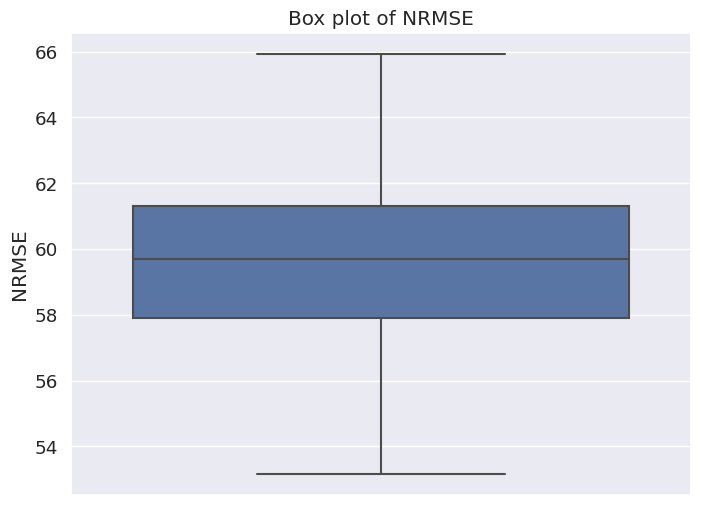

{'Base Models': ['Linear Regression', 'Random Forest', 'SVM', 'AdaBoost'], 'Final Estimator': 'Linear Regression'}


In [104]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score, RepeatedKFold, GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.svm import SVR
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.cross_decomposition import PLSRegression
from catboost import CatBoostRegressor
import matplotlib.pyplot as plt
import seaborn as sns

# Sample data
X_train = pd.DataFrame(np.random.rand(1000, 10), columns=[f'feature_{i}' for i in range(10)])
y_train = pd.Series(np.random.rand(1000))

cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=42)

# Initialize base models with their best parameters
best_params = {
    'Linear Regression': {'fit_intercept': True},
    'Random Forest': {'max_depth': 10, 'n_estimators': 150},
    'SVM': {'C': 10.0, 'kernel': 'linear'},
    'AdaBoost': {'learning_rate': 0.1, 'n_estimators': 100},
}

# Initialize base models with their best parameters
base_models = [
    ('Linear Regression', LinearRegression(**best_params['Linear Regression'])),
    ('Random Forest', RandomForestRegressor(**best_params['Random Forest'])),
    ('SVM', SVR(**best_params['SVM'])),
    ('AdaBoost', AdaBoostRegressor(**best_params['AdaBoost'])),
]

stacking_model = StackingRegressor(estimators=base_models, final_estimator=LinearRegression())

predictions_stacked = []
nrmse_stacked = []

for train_idx, val_idx in cv.split(X_train):
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    stacking_model.fit(X_train_fold, y_train_fold)
    preds = stacking_model.predict(X_val_fold)

    predictions_stacked.extend(preds)

    mse = mean_squared_error(y_val_fold, preds)
    nrmse = (np.sqrt(mse) / y_val_fold.mean()) * 100
    nrmse_stacked.append(nrmse)


#predictions_df['Stacked Model'] = predictions_stacked
#nrmse_df['Stacked Model'] = [nrmse_stacked]

# Store hyperparameters
hyperparameters = {'Base Models': [name for name, _ in base_models], 'Final Estimator': 'Linear Regression'}

# Visualize NRMSE with a boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(y=nrmse_stacked)
plt.title('Box plot of NRMSE')
plt.ylabel('NRMSE')
plt.show()

# Print hyperparameters
print(hyperparameters)


In [ ]:
# Save predictions and NRMSE to Excel
file_path = "/path/to/save/results.xlsx"
results_df.to_excel(file_path, index=False)